# 0. Setup

In [1]:
# Import the necessary packages
from tensorflow.keras.datasets import mnist
from imutils import build_montages
import numpy as np
import cv2

import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pandas as pd
import random
from sklearn.utils import shuffle
import tensorflow as tf
#import coremltools as ct 

# Siamese Network Packages
from __future__ import absolute_import, print_function
import os
import sys
from random import randint
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras import Model
from tensorflow.keras import backend as K, metrics
#from sklearn import metrics
from tensorflow.keras.applications import VGG19
from tensorflow.keras.applications.vgg19 import preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.layers import Dense, Dropout, Flatten, Input
from tensorflow.keras.optimizers import SGD
from sklearn.metrics import cohen_kappa_score, confusion_matrix
from tensorflow.keras.models import load_model
## Import classes from same folder (only necessary when run interactively)
sys.path.append(r'C:/Users/wthac/Desktop/Value Australia/Modelling/GSV Deep Mapping/Modelling/Maroubra Subset')
from minibatch_generator_Illic import myDataGeneratorAug

In [2]:
# Set random seed
rs = 42

# Path
path = "C:\\Value Australia\\GSV Deep Mapping\\Data\\SCNN Inputs\\Maroubra_3000_4000_ELYAS/"

# 1. Import Data

## 1.1 Set paths & assumptions

In [3]:
# Define function variables
IMG_SIZE = 224
yes_fname=path+os.sep+"yes.npy"
no_fname=path+os.sep+"no.npy"
x_test_fname=path+os.sep+"testarrayX.npy"
y_test_fname=path+os.sep+"testarrayY.npy"
x_valid_fname=path+os.sep+"validarrayX.npy"
y_valid_fname=path+os.sep+"validarrayY.npy"
training_results_save=path+os.sep+"trainresultlist.npy"
validation_results_save=path+os.sep+"validplustestresultlist.npy"

## 1.2 Import Training and Test data

In [4]:
valid_results = np.load(validation_results_save, allow_pickle = True)
train_results = np.load(training_results_save, allow_pickle = True)  #
X_valid = np.load(x_valid_fname)
y_valid = np.load(y_valid_fname)
X_test = np.load(x_test_fname)
y_test = np.load(y_test_fname)
yes=pd.read_pickle(yes_fname)
no=pd.read_pickle(no_fname)

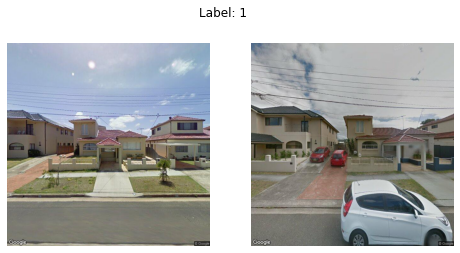

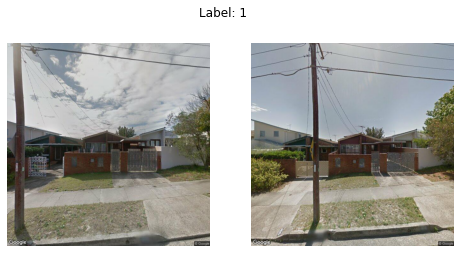

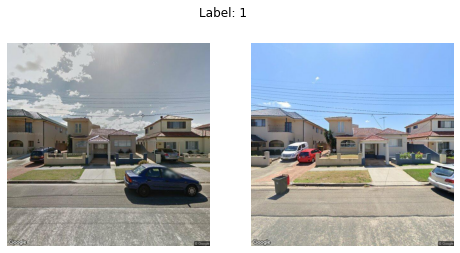

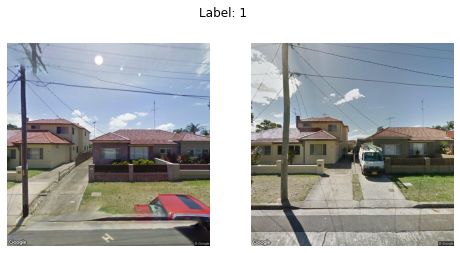

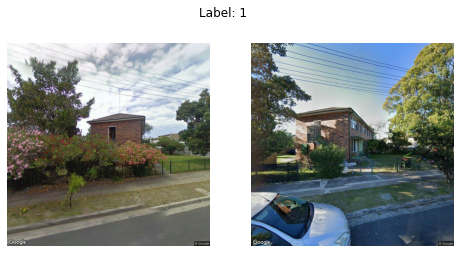

...

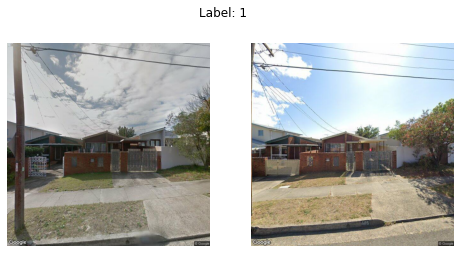

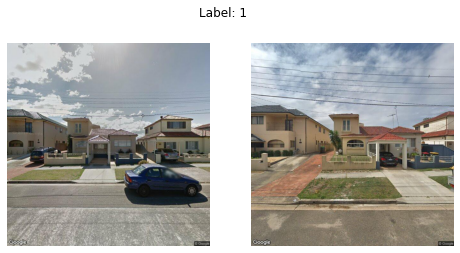

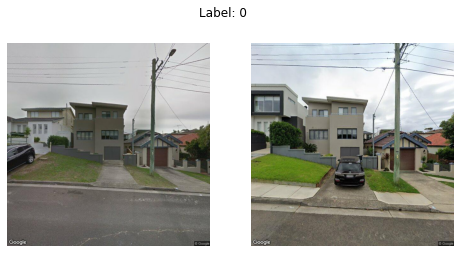

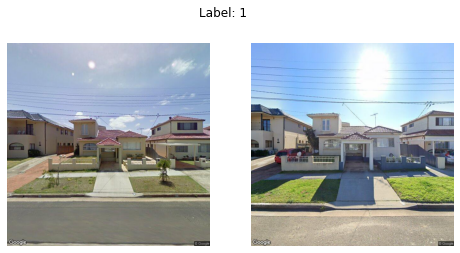

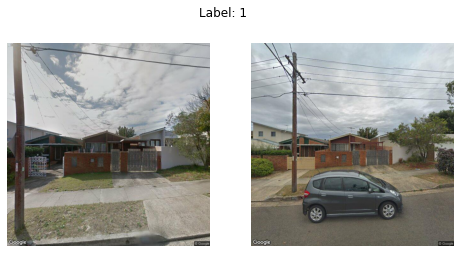

In [6]:
# Run code to visualise ImagePairs - [UNPROCESSED] TRAINING SET
#for i in range(100):
for i in range(len(train_results)):
    # Load both images
    imageA = mpimg.imread(train_results[i, 0])
    imageB = mpimg.imread(train_results[i, 1])
    
    # Get Label
    labela = train_results[i,2]
    
    ## Visualise image pairs
    # initialize the figure
    fig = plt.figure("Pair #{}".format(i + 1), figsize=(8, 4))
    plt.suptitle("Label: {:.0f}".format(labela))

    # show first image
    ax = fig.add_subplot(1, 2, 1)
    plt.imshow(imageA, cmap=plt.cm.gray)
    plt.axis("off")

    # show the second image
    ax = fig.add_subplot(1, 2, 2)
    plt.imshow(imageB, cmap=plt.cm.gray)
    plt.axis("off")

    # show the plot
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


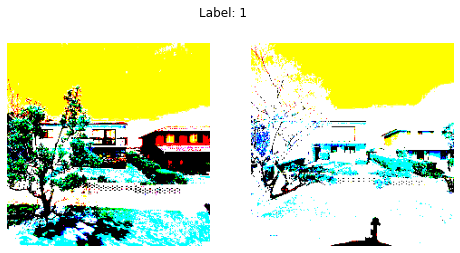

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


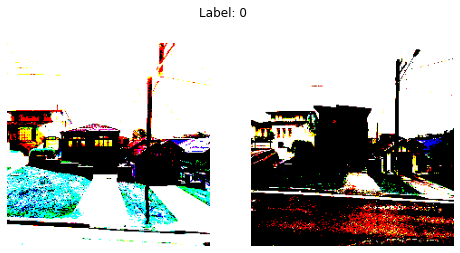

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


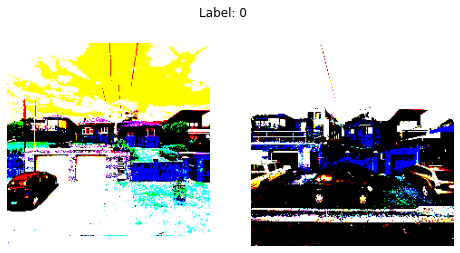

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


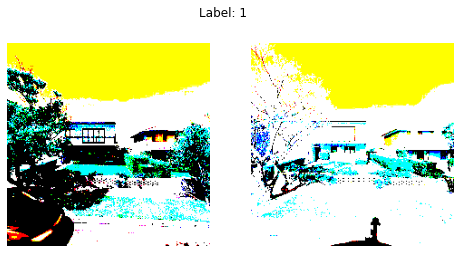

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


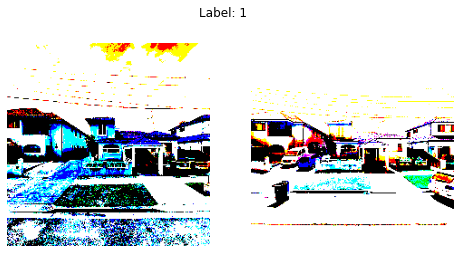

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


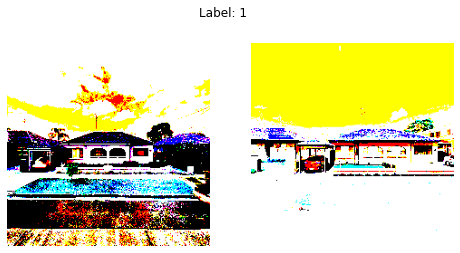

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


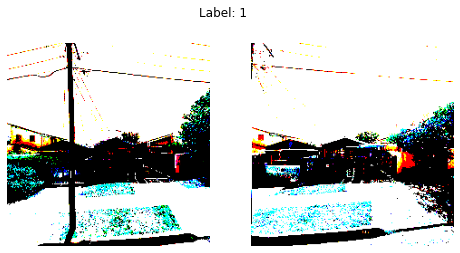

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


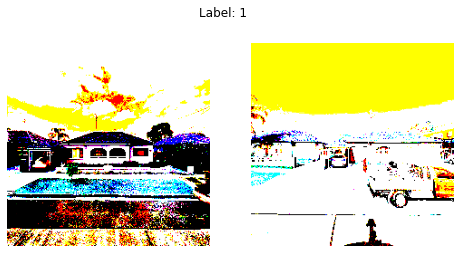

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


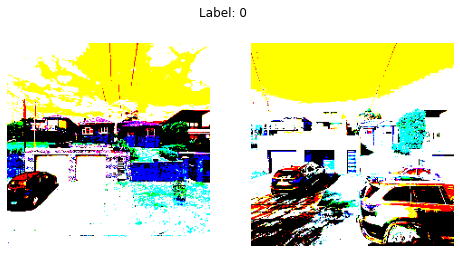

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


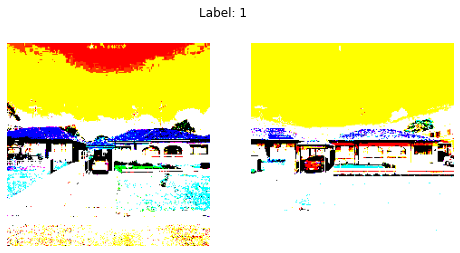

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


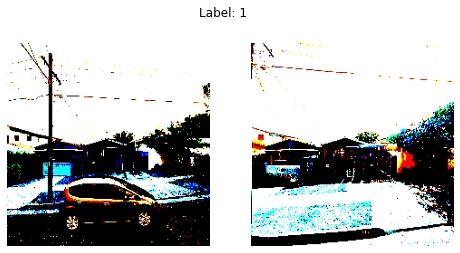

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


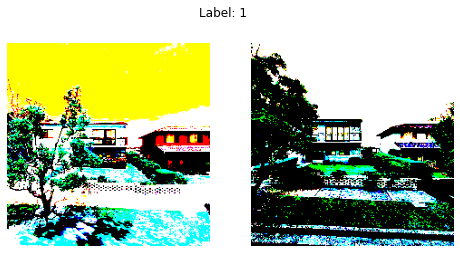

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


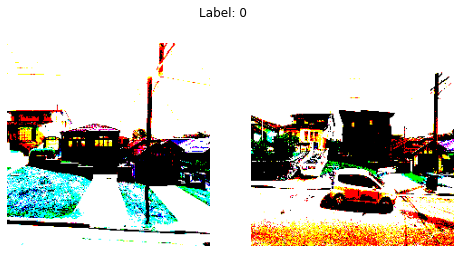

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


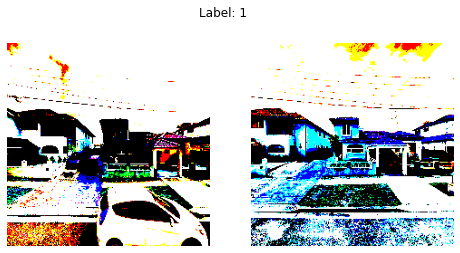

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


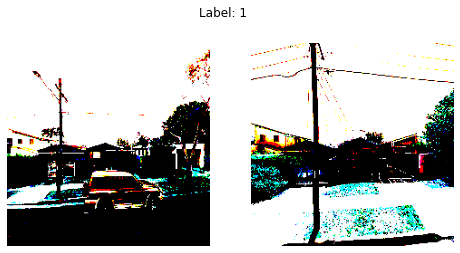

In [7]:
# Run code to visualise ImagePairs - [PRE_PROCESSED] VALIDATION SET
#for i in range(100):
for i in range(len(X_valid)):
    # Load both images
    imageA = X_valid[i, 0]
    imageB = X_valid[i, 1]
    
    # Get Label
    labela = y_valid[i]
    
    ## Visualise image pairs
    # initialize the figure
    fig = plt.figure("Pair #{}".format(i + 1), figsize=(8, 4))
    plt.suptitle("Label: {:.0f}".format(labela))

    # show first image
    ax = fig.add_subplot(1, 2, 1)
    plt.imshow(imageA, cmap=plt.cm.gray)
    plt.axis("off")

    # show the second image
    ax = fig.add_subplot(1, 2, 2)
    plt.imshow(imageB, cmap=plt.cm.gray)
    plt.axis("off")

    # show the plot
    plt.show()

# 2. Initialise and perform first model run (without top convolutional layers)

## 2.1 Model constraints

In [14]:
# Define image shape: 224 x 224, 3 colour layers
IMG_SHAPE = (224, 224, 3)

# Specify the batch size and number of epochs
BATCH_SIZE = 32           # Using batch size 64 from PyImageSearch; Illic et al. (2019) used batch size 32
EPOCHS = 5               # Start with 15; increase to get better accuracy

# Define the path to the base output directory
BASE_OUTPUT = path

# Use the base output path to derive the path to the serialized
# model along with training history plot
MODEL_PATH = os.path.sep.join([BASE_OUTPUT, "siamese_model"])
PLOT_PATH = os.path.sep.join([BASE_OUTPUT, "plot.png"])
WEIGHTS_PATH = os.path.sep.join([BASE_OUTPUT, "vgg_siamese_base_train_weights"])

# Illic model paths
history_continue_training = os.path.sep.join([BASE_OUTPUT, "mdict14try_vgg_norm.npy"])
fine_tune_model_path=os.path.sep.join([BASE_OUTPUT, "model_FC_Block5_952.h5"])

## 2.2 Define necessary functions to compute/graph loss

In [9]:
# Compute accuracy
def compute_accuracy(predictions, labels):
    """Function that determines the score to compute. Here it is the cohen kappa
    score.
    """
    return cohen_kappa_score(predictions, labels)

# Compute AUC
def auc_score(labels, predictions):
    from sklearn.metrics import roc_auc_score
    return roc_auc_score(labels, predictions)

# Graph Loss
def plot_training(H, plotPath):
    # construct a plot that plots and saves the training history
    plt.style.use("ggplot")
    plt.figure()
    plt.plot(H.history["loss"], label="train_loss")
    plt.plot(H.history["val_loss"], label="val_loss")
    plt.plot(H.history["binary_accuracy"], label="train_acc")
    plt.plot(H.history["val_binary_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend(loc="lower left")
    plt.savefig(plotPath)

## 2.3 Siamese Network Architecture using VGG19 ImageNet Weights

In [11]:
def the_model(run_new=False, unfreeze=False):
    print("Creating new model instance with bottom frozen...")
    vision_model = VGG19(include_top=False,
                         weights='imagenet',
                         input_shape=(IMG_SIZE, IMG_SIZE, 3))

    # Definition of the 2 inputs
    img_a = Input(shape=IMG_SHAPE)
    img_b = Input(shape=IMG_SHAPE)

    # Outputs of the vision model corresponding to the inputs
    # Note that this method applies the 'tied' weights between the branches
    out_a = vision_model(img_a)
    out_b = vision_model(img_b)

    # Concatenation of these outputs
    concat = keras.layers.concatenate([out_a, out_b])

    # For fine tuning make convolution base not-trainable with unfreeze=False (bottleneck feature extractor)
    # Make trainable to fine tune top convolution layers

    vision_model.trainable = False
    print("Vision model is not trainable")


    # Definition of the top layers
    concat = Flatten()(concat)
    concat = Dropout(0.3)(concat)
    concat = Dense(4096, activation='relu', kernel_initializer='glorot_normal', name="Dense1")(concat)
    concat = Dropout(0.3)(concat)
    concat = Dense(4096, activation='relu', kernel_initializer='glorot_normal', name="Dense2")(concat)
    concat = Dropout(0.1)(concat)
    concat = Dense(1000, activation='relu', kernel_initializer='glorot_normal', name="Dense3")(concat)
    main_out = Dense(1, activation='sigmoid')(concat)

    # The classification model is the full model: it takes 2 images as input and
    # returns a number between 0 and 1. The closest the number is to 1, the more confident
    # it is that there was a change
    classification_model = Model([img_a, img_b], main_out)

    # if not run_new:
    #     classification_model.load_weights(weights_file,by_name=True)  # ""f:/models/backup_92_fc_only.h5")#
    #     # "f:/models/vgg19_siamese_14th_try_vgg_norm_fine_tuned_29_Dec_17_514pm.h5")#weights_file)#,by_name=True))#
    #     print("Weights loaded..")
    #
    # # Unfreeze top convolution layers for second step of fine tuning after training model tuning only top FC layers
    # if unfreeze:
    #

    # Definition of the SGD optimizer, that allows to fine tune learning rate (very important)
    sgd = SGD(learning_rate=1e-6, decay=1e-6, momentum=0.5, nesterov=True)
    #sgd = SGD(learning_rate=1e-2, decay=1e-2, momentum=0.5, nesterov=True)         # VERY LOW LEARNING RATE TO START WITH
    # Compilation of the model using a loss used for binary problems
    classification_model.compile(loss='binary_crossentropy', optimizer=sgd,
                                 metrics=[metrics.binary_accuracy, metrics.mae, metrics.mse])
#    classification_model.compile(loss='binary_crossentropy', optimizer=sgd,
#                                 metrics=[metrics.accuracy_score, metrics.balanced_accuracy_score, 
#                                          metrics.precision_score, metrics.recall_score])

    return classification_model

In [12]:
# save all history params
print("\n\nNew run of model\n\n")
mdict = {
    'binary_accuracy': [], 'loss': [], 'mean_absolute_error': [], 'mean_squared_error': [],
    'val_binary_accuracy': [], 'val_loss': [], 'val_mean_absolute_error': [], 'val_mean_squared_error': []
    }
classification_model = the_model(run_new=True)

classification_model.summary()



New run of model


Creating new model instance with bottom frozen...
Vision model is not trainable
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 vgg19 (Functional)             (None, 7, 7, 512)    20024384    ['input_2[0][0]',          

### RUN WITH JUST ONE ITERATION

In [16]:
yesno = yes.append(no)
labels = dict(zip([str(x) for x in yesno.index.tolist()],
                  [1 if x == 1 else 0 for x in yesno.winner.tolist()]))
partition = {'train': list(zip([str(x) for x in yesno.index.tolist()], zip(yesno.left_id, yesno.right_id)))}

batchSizeAug = len(yesno.index.tolist())
# Set-up variables for augmentation of current batch of yesno in partition
params = {
    'dim_x': 224,
    'dim_y': 224,
    'dim_z': 3,
    'batch_size': batchSizeAug,
    'shuffle': True
    }

datagenargs = {
    'rotation_range': 2, 'width_shift_range': 0.2, 'height_shift_range': 0.2,
    'shear_range': 0.1,
    'zoom_range': 0.25, 'horizontal_flip': True, 'fill_mode': 'nearest'
    }

training_generator = myDataGeneratorAug(**params).generate(labels, partition['train'], seed=randint(1,10000), #seed=rs,
                                                           datagenargs=datagenargs)

X, y = training_generator.__next__()
# zero center images
X = np.array(X)
# X=X.astype(float) - np.mean(X, axis=0)
# Fitting the model.
cls_wt = {0: 10, 1: 90}
#    checkpointer = ModelCheckpoint(filepath=check_point_weights, verbose=1, save_best_only=True)
mout = classification_model.fit([X[0], X[1]],
                                y,
                                batch_size=BATCH_SIZE,
                                epochs=EPOCHS,
                                validation_data=([X_valid[:, 0], X_valid[:, 1]], y_valid),
                                verbose=1, class_weight=cls_wt ) 

hello

hello

46
Using data generator for batch...[                      ] 0.00%46
Using data generator for batch...[                      ] 2.17%46
Using data generator for batch...[                      ] 4.35%46
Using data generator for batch...[ =                    ] 6.52%46
Using data generator for batch...[ =                    ] 8.70%46
Using data generator for batch...[ ==                   ] 10.87%46
Using data generator for batch...[ ==                   ] 13.04%46
Using data generator for batch...[ ===                  ] 15.22%46
Using data generator for batch...[ ===                  ] 17.39%46
Using data generator for batch...[ ===                  ] 19.57%46
Using data generator for batch...[ ====                 ] 21.74%46
Using data generator for batch...[ ====                 ] 23.91%46
Using data generator for batch...[ =====                ] 26.09%46
Using data generator for batch...[ =====                ] 28.26%46
Using data generator for batch...[ ======         

### RUN WITH MULTIPLE ITERATIONS

In [ ]:
# number of wanted iterations. Each iteration takes a different set of augmented images so
# keep this number high (depending on the learning rate) when training the model
n_iter = 4
kappas = []
test_eval = []
# Initialisation of a confusion matrix
conf_mat = np.zeros((2, 2))
threashold = 0.8
for iteration in range(n_iter):
    print(iteration / n_iter)
#    check_point_weights=input_path+os.sep+"checkpoint_FC_{}.npy".format(iteration)

    # sample positive and negative cases for current iteration. It is faster to use fit on batch of n yesno and augment
    # that batch using datagen_class_aug_test than to use fit_generator with the datagen_class_aug_test and small batch
    # sizes.
    #700 3500 for full training
#    yesno = yes.sample(626).append(no.sample(3424))
    yesno = yes.append(no)
    labels = dict(zip([str(x) for x in yesno.index.tolist()],
                      [1 if x == 1 else 0 for x in yesno.winner.tolist()]))
    partition = {'train': list(zip([str(x) for x in yesno.index.tolist()], zip(yesno.left_id, yesno.right_id)))}

    batchSizeAug = len(yesno.index.tolist())
    # Set-up variables for augmentation of current batch of yesno in partition
    params = {
        'dim_x': 224,
        'dim_y': 224,
        'dim_z': 3,
        'batch_size': batchSizeAug,
        'shuffle': True
        }

    datagenargs = {
        'rotation_range': 2, 'width_shift_range': 0.2, 'height_shift_range': 0.2,
        'shear_range': 0.1,
        'zoom_range': 0.25, 'horizontal_flip': True, 'fill_mode': 'nearest'
        }

    training_generator = myDataGeneratorAug(**params).generate(labels, partition['train'], seed=rs,
                                                               datagenargs=datagenargs)

    X, y = training_generator.__next__()
    # zero center images
    X = np.array(X)
    # X=X.astype(float) - np.mean(X, axis=0)
    # Fitting the model.
    cls_wt = {0: 10, 1: 90}
#    checkpointer = ModelCheckpoint(filepath=check_point_weights, verbose=1, save_best_only=True)
    mout = classification_model.fit([X[0], X[1]],
                                    y,
                                    batch_size=BATCH_SIZE,
                                    epochs=EPOCHS,
                                    validation_data=([X_valid[:, 0], X_valid[:, 1]], y_valid),
                                    verbose=1, class_weight=cls_wt ) 
                                    # ,callbacks=[checkpointer])
    # mout = classification_model.fit_generator(generator=training_generator,
    #                                           steps_per_epoch=len(partition['train']) // params['batch_size'],
    #                                           epochs=1,
    #                                           validation_data=([X_valid[:, 0], X_valid[:, 1]], y_valid))  # ,reduce_lr])

    # Concatenate history
    for k, v in mout.history.items():
        for i in v:
            mdict[k].append(i)

    test_val=mdict['val_binary_accuracy'][-1]
    if test_val > threashold:
        print("\n\nSaving model....\n\n")
        classification_model.save(model_save)
        classification_model.save_weights(weights_file)
        np.save(history_continue_training, np.array(mdict))
        threashold = test_val



np.save(history_continue_training, np.array(mdict))

## 2.4 Plot training history

[INFO] plotting training history...


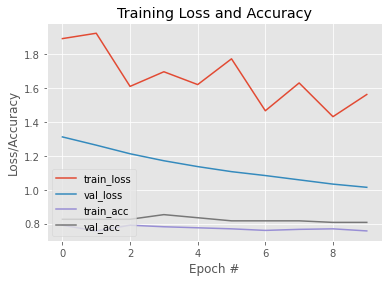

In [12]:
# plot the training history
print("[INFO] plotting training history...")
plot_training(history, PLOT_PATH)

# 3. Fine tune existing model (with top convolutional layers)

In [ ]:
def fine_tune_existing(model_path=fine_tune_model_path, unfreeze="block5_conv1"):
    print("Loading existing model instance and unfreezing top convolution layers...")
    K.clear_session()
    classification_model = classification_model
#    classification_model = load_model(MODEL_PATH)
    set_trainable = False
    for layer in classification_model.get_layer('vgg19').layers:
        if layer.name == unfreeze:
            set_trainable = True
        if set_trainable:
            layer.trainable = True
        else:
            layer.trainable = False
    print("{} convolution unfrozen from model {}".format(unfreeze, model_path))
    sgd = SGD(learning_rate=1e-6, decay=1e-6, momentum=0.5, nesterov=True)
    # Recompilation of model because of weight changes
    classification_model.compile(loss='binary_crossentropy', optimizer=sgd,
                                 metrics=[metrics.binary_accuracy, metrics.mae, metrics.mse])
#    classification_model.compile(loss='binary_crossentropy', optimizer=sgd,
#                                 metrics=[metrics.accuracy_score, metrics.balanced_accuracy_score, 
#                                          metrics.precision_score, metrics.recall_score])
    print(classification_model.trainable_weights)
    return classification_model

In [ ]:
run_new=False
if run_new:
    # save all history params
    print("\n\nNew run of model\n\n")
    mdict = {
        'binary_accuracy': [], 'loss': [], 'mean_absolute_error': [], 'mean_squared_error': [],
        'val_binary_accuracy': [], 'val_loss': [], 'val_mean_absolute_error': [], 'val_mean_squared_error': []
        }
    classification_model = the_model(run_new=True)
else:
    print("\n\nLoading training history\n\n")
    mdict = np.load(history_continue_training)
    mdict = mdict.tolist()
    classification_model = fine_tune_existing(unfreeze="block4_conv1")
    
classification_model.summary()

# 4. Run network on test set

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


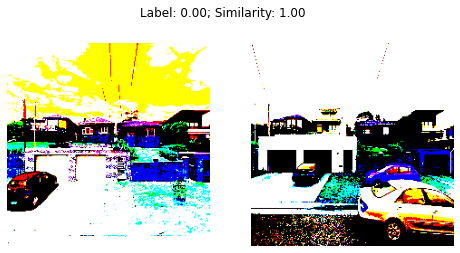

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


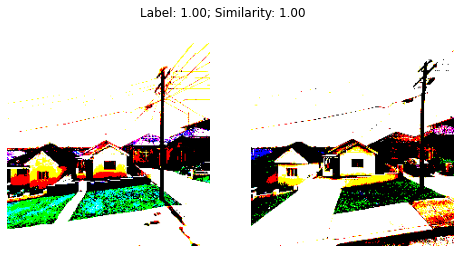

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


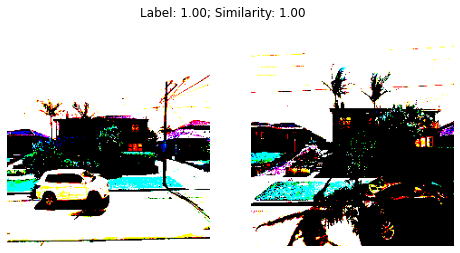

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


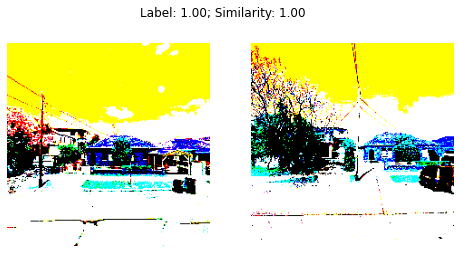

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


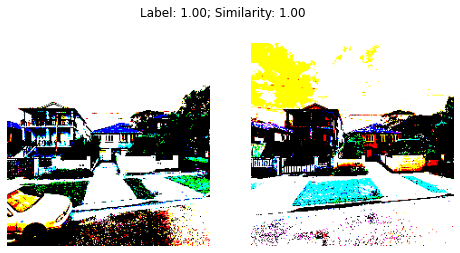

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


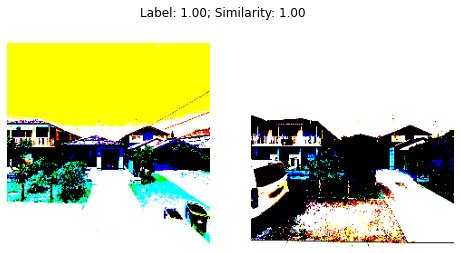

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


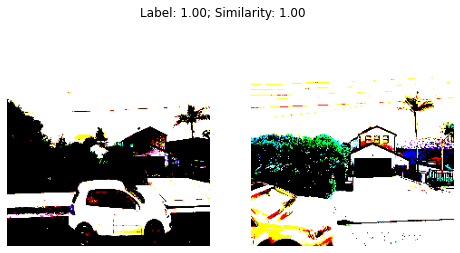

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


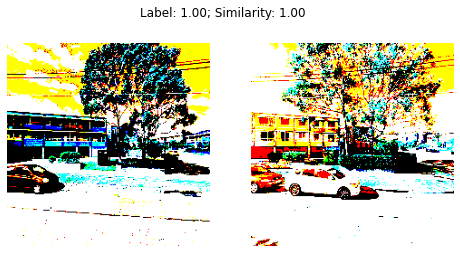

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


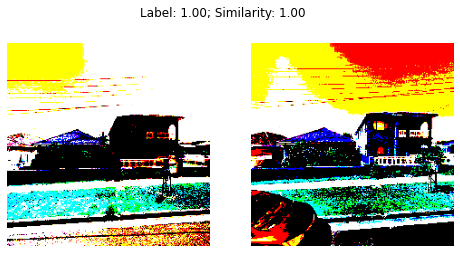

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


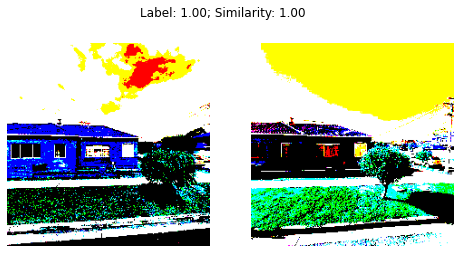

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


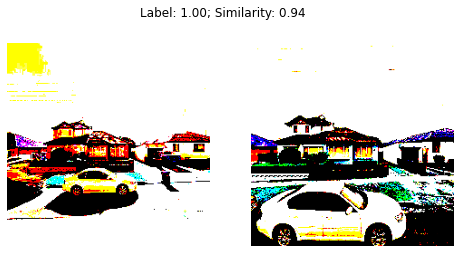

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


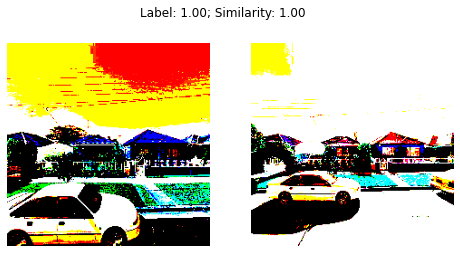

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


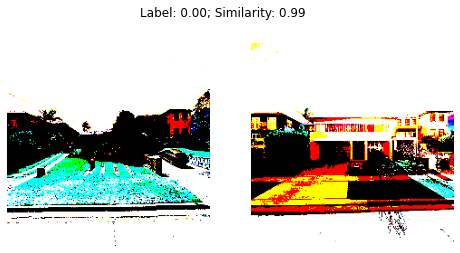

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


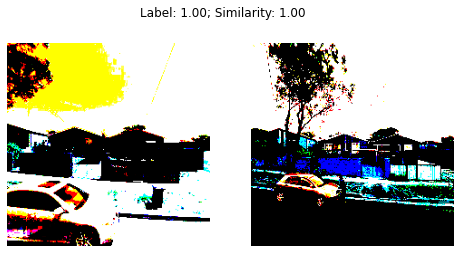

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


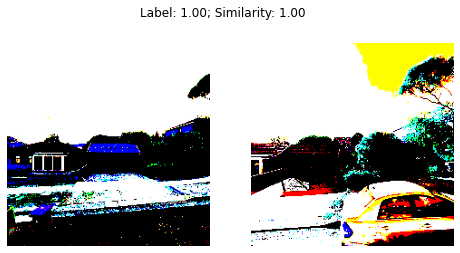

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


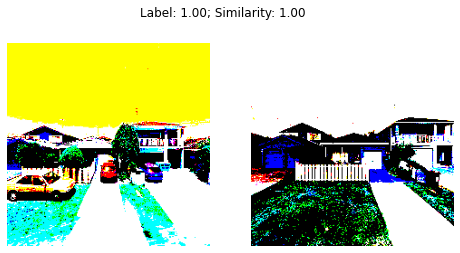

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


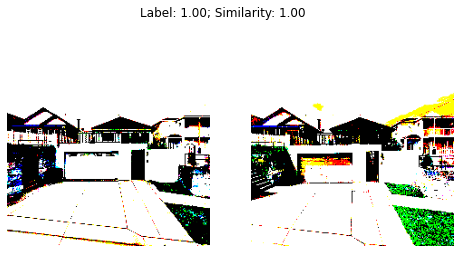

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


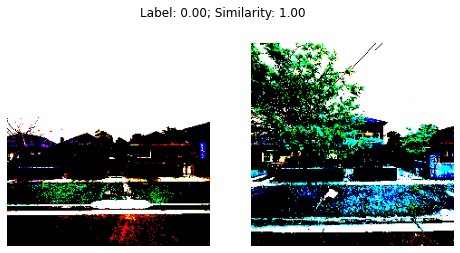

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


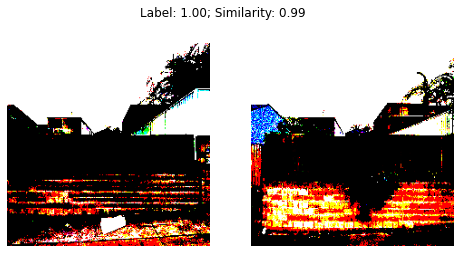

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


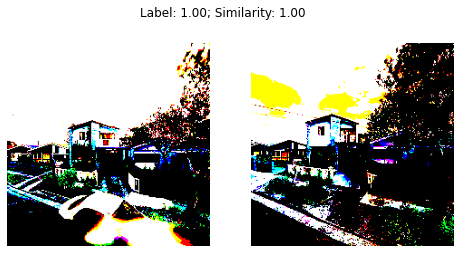

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


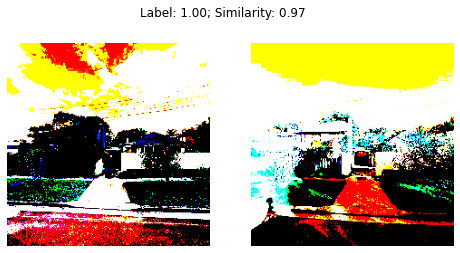

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


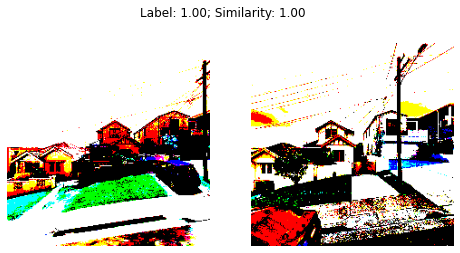

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


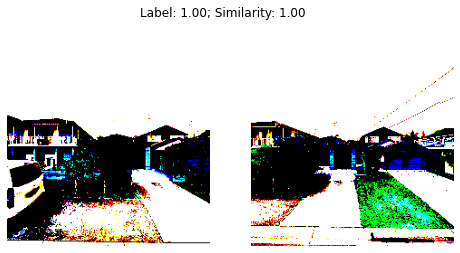

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


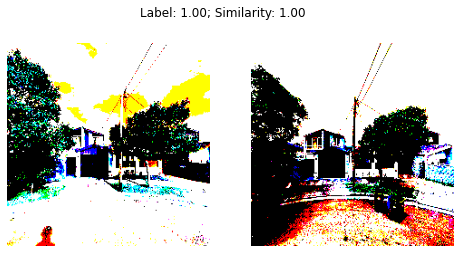

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


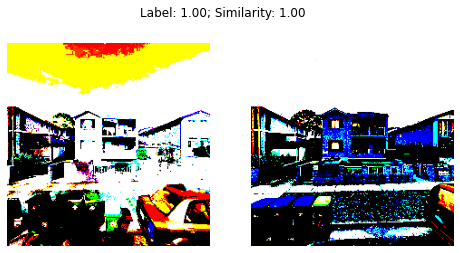

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


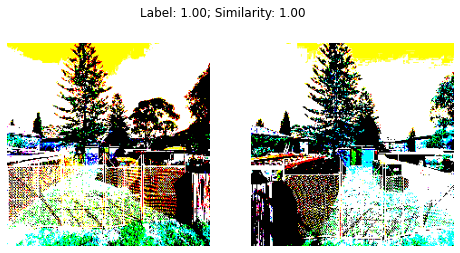

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


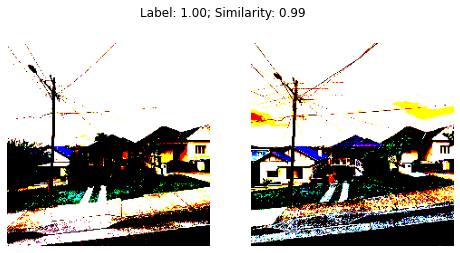

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


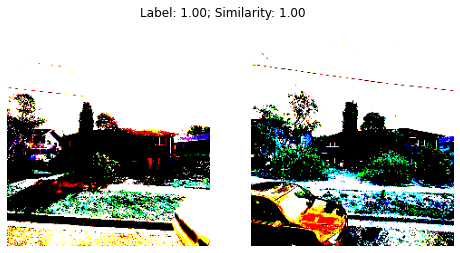

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


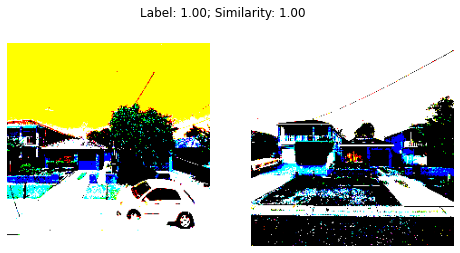

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


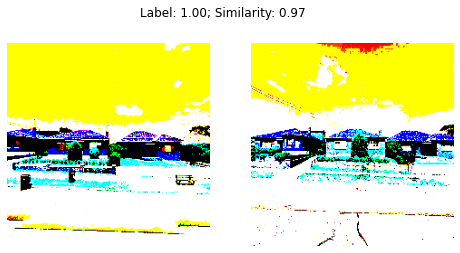

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


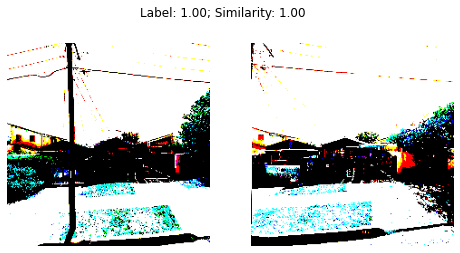

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


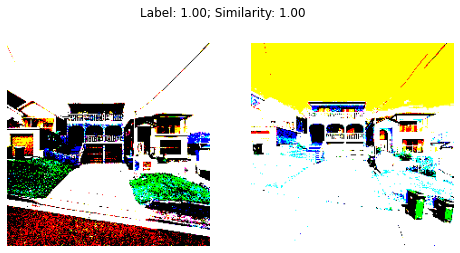

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


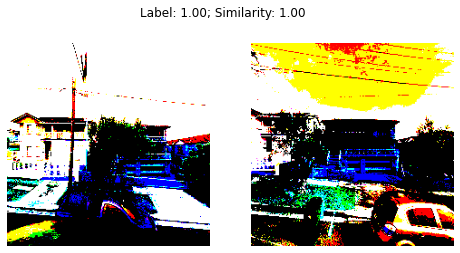

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


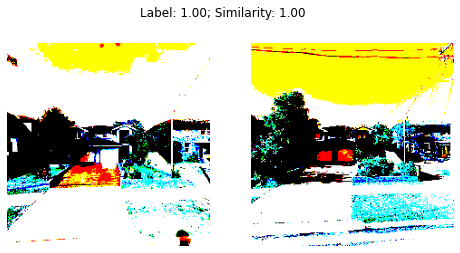

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


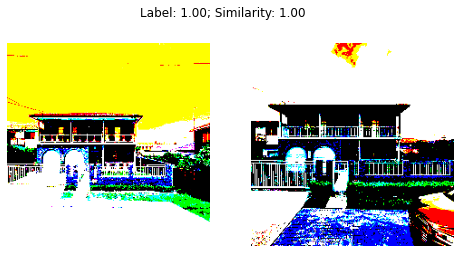

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


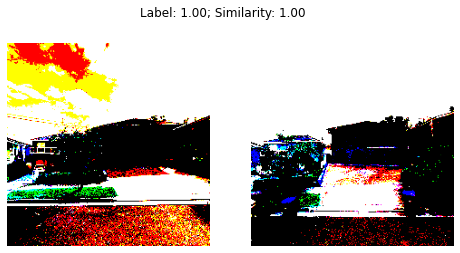

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


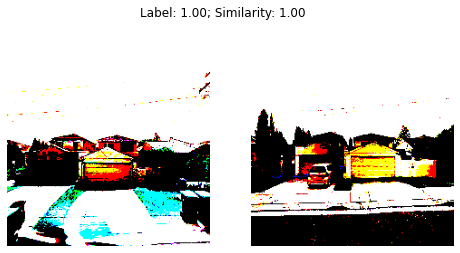

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


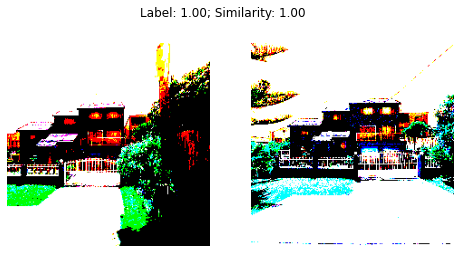

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


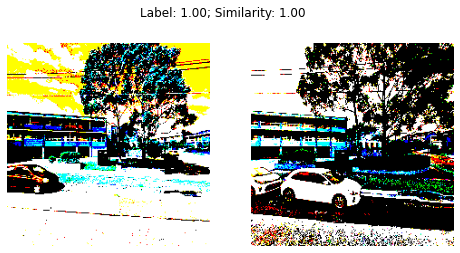

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


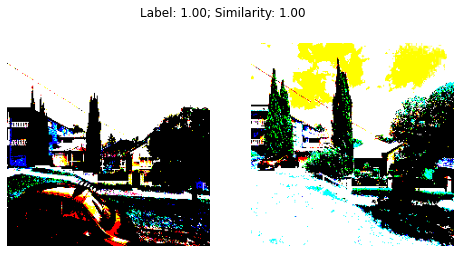

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


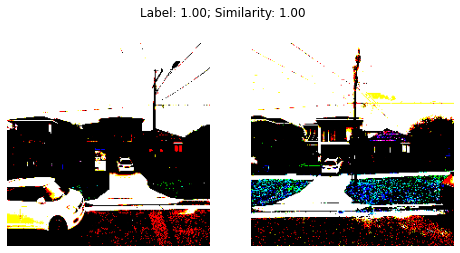

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


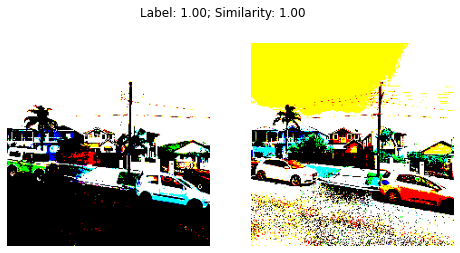

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


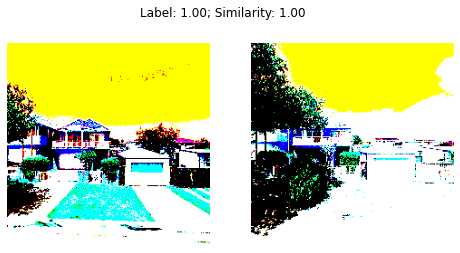

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


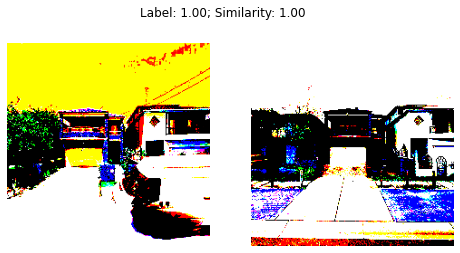

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


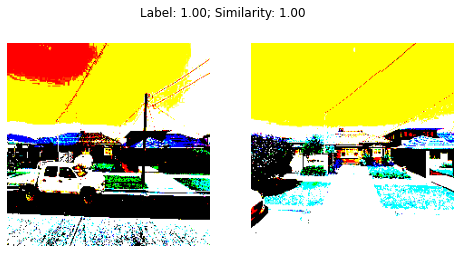

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


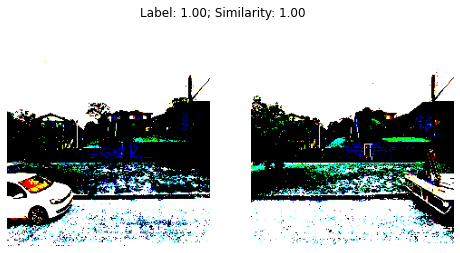

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


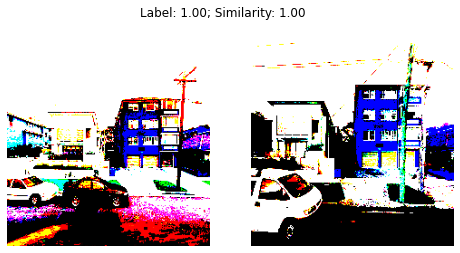

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


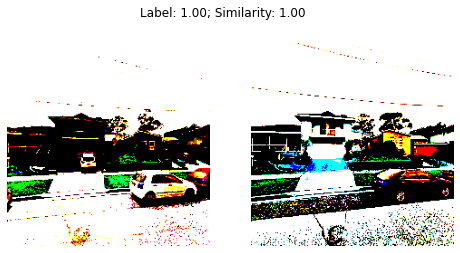

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


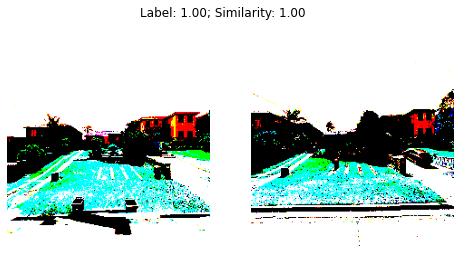

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


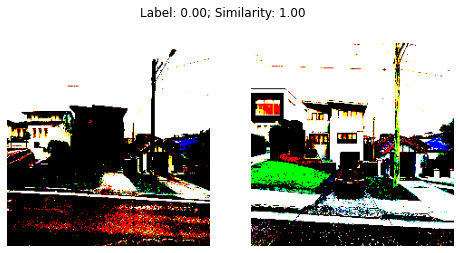

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


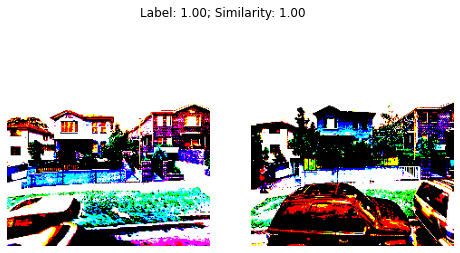

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


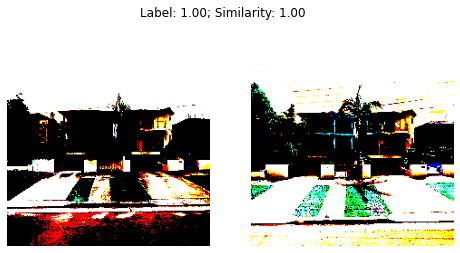

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


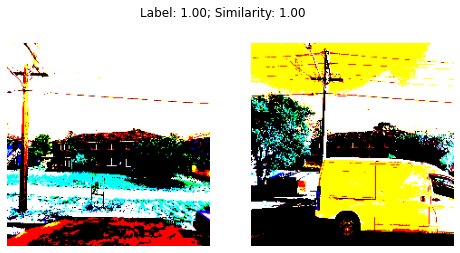

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


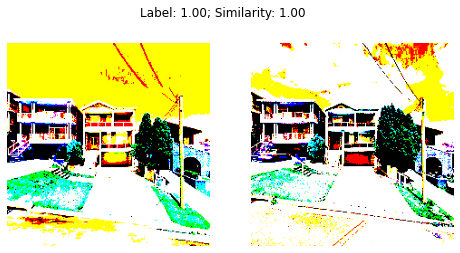

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


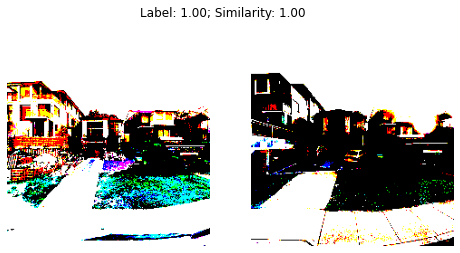

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


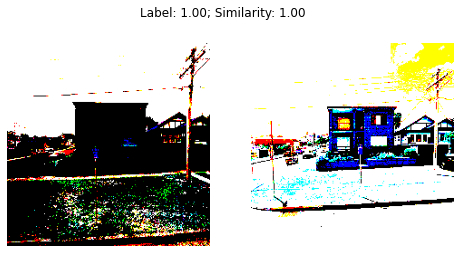

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


In [ ]:
# Load in model:
#model = load_model(MODEL_PATH)
model = classification_model

# Run code to predict similarity and visualise for each test pair
#for i in range(len(X_test)):
for i in range(100):
    # Load both images
    imageA = X_test[i, 0]
    imageB = X_test[i, 1]
    labelA = y_test[i]
    
    # Create a copy of both images for visualisation purpose
    origA = imageA.copy()
    origB = imageB.copy()
    
    # add channel a dimension to both the images
    imageA = np.expand_dims(imageA, axis=-1)
    imageB = np.expand_dims(imageB, axis=-1)
    
    # add a batch dimension to both images
    imageA = np.expand_dims(imageA, axis=0)
    imageB = np.expand_dims(imageB, axis=0)
    
    # use our siamese model to make predictions on the image pair,
    # indicating whether or not the images belong to the same class
    preds = model.predict([imageA, imageB])
    proba = preds[0][0]
    
    ## Visualise image pairs
    # initialize the figure
    fig = plt.figure("Pair #{}".format(i + 1), figsize=(8, 4))
    plt.suptitle("Label: {:.2f}; ".format(labelA) + "Similarity: {:.2f}".format(proba))

    # show first image
    ax = fig.add_subplot(1, 2, 1)
#    plt.imshow((origA * 255).astype(np.uint8), cmap=plt.cm.gray)
    plt.imshow(origA, cmap=plt.cm.gray)
    plt.axis("off")

    # show the second image
    ax = fig.add_subplot(1, 2, 2)
#    plt.imshow((origB * 255).astype(np.uint8), cmap=plt.cm.gray)
    plt.imshow(origB, cmap=plt.cm.gray)
    plt.axis("off")

    # show the plot
    plt.show()